# Chapter 1 - Quiz

Os quizzes desse capítulo avalia o conhecimento prático sobre como carregar modelos com o `pipeline`, fazer o reconhecimento de entidades nomeadas, conceitos de transfer learning, pré-treinamento de LLMs, informações sobre modelos, arquitetura e pesos, tipos de modelos e tarefas (decoder, encoders, encoder-decoder), origem dos vieses nos modelos, etc.

- Reconhecimento de entidades nomeadas (NER) -> Extrai pessoas, lugares, organizações, etc., dos tokens.
- Masked Language Modeling -> Usado com modelos como bert, onde o token [MASK] é substituído pela predição mais provável.
- Zero-shot Classification -> Permite classificar textos sem precisar treinar o modelo previamente nas categorias.
- Transfer Learning -> Reutilizar um modelo pré-treinado em uma nova tarefa, geralmente aproveitando os pesos aprendidos.
- Pré-treinamento de LLMs -> Feito de forma auto-supervisionada, sem rótulos explícitos. Exemplo: prevendo palavras ocultas (masked words).
- Tipos de modelos e tarefas -> Decoder: ideal para geração de texto (ex: GPT). Encoder: ideal para classificação (ex: BERT). Encoder-decoder (seq2seq): ideal para resumo, tradução, etc. (ex: T5, BART).
- Viés (Bias) -> Viés pode vir dos dados de pré-treinamento, transfer learning ou da forma como o modelo foi otimizado.

In [1]:
from PIL import Image


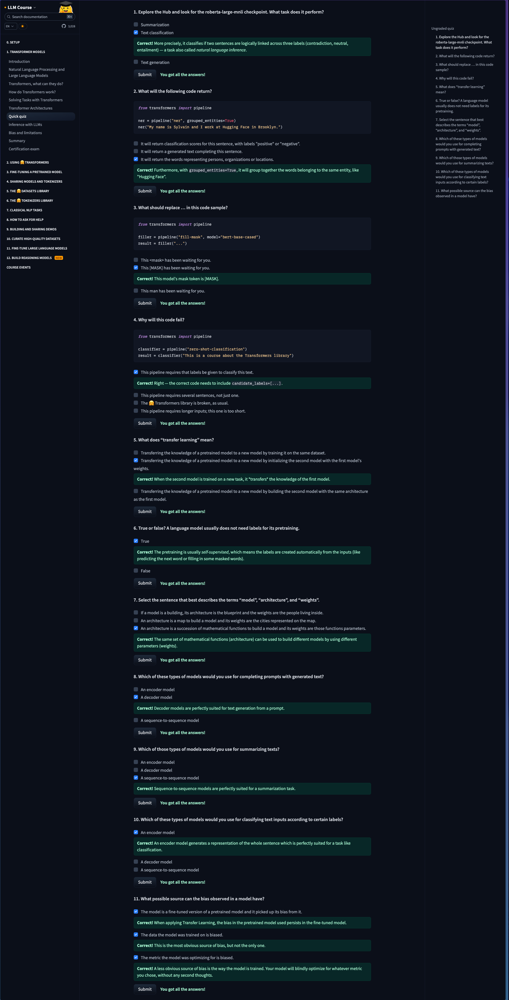

In [2]:
Image.open('assets/2025-06-14 hugging face transformer models quiz answers.png')

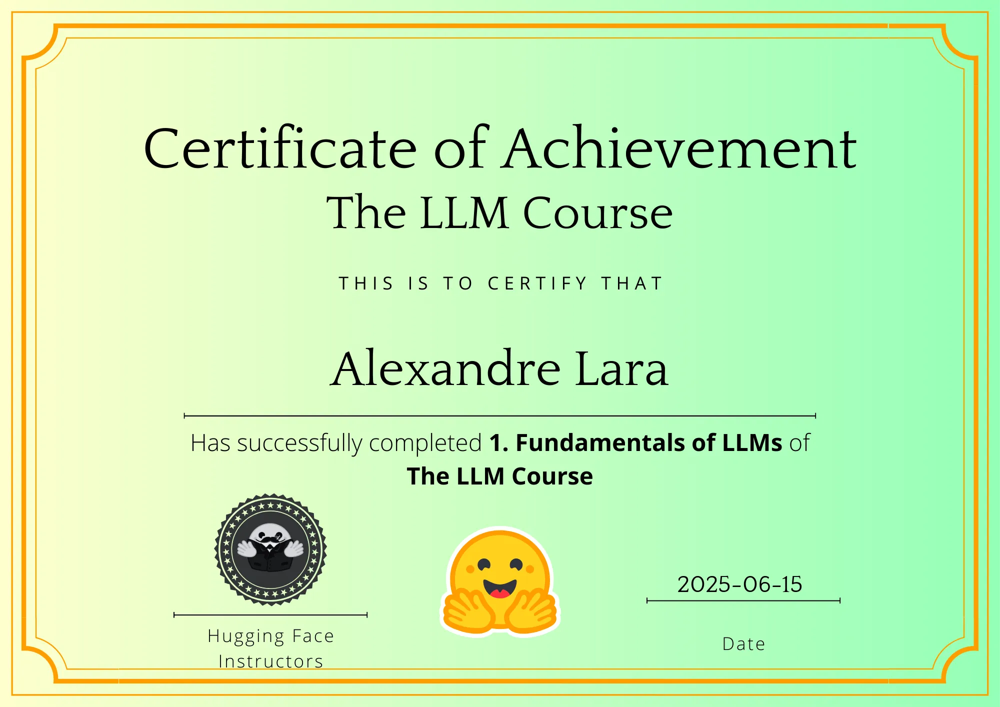

In [3]:
Image.open('assets/2025-06-14 certificate hugging face fundamentals of llms of llms course.webp')

# Chapter 2

O quiz do segundo capítulo exercita os conhecimentos na pipeline dos modelos de linguagem, conceitos de tokenização (como tokenização por subpalavras e técnicas para dividir palavras em palavras menores), as dimensões de saída de um modelo transformer (batch size, sequence length, hidden size), detalhes sobre o uso de AutoModel e AutoTokenizar (classes utilitárias para escolher automaticamente o modelo/tokenizer com base no checkpoint usado), processo de batching e comprimentos variáveis (para forçar o mesmo tamanho dos inputs cortando o texto ou fazendo padding), comenta sobre a função softmax (transformando os logits em probabilidades entre 0 e 1), conversão de tokens com o tokenizer, compatibilidade de checkpoints (sempre usar o tokenizer e modelo do mesmo checkpoint para compartilhar o vocabulário e embeddings).

- Pipeline de modelagem de linguagem -> O pipeline envolve: tokenização -> modelo -> decodificação. A tokenização faz o processo de transformar os tokens em IDs, o modelo gera previsões e a saída pode ser decodificada de volta em texto.
- Dimensões de saída do modelo Transformer -> Geralmente tem 3 dimensões (batch size, sequence length e hidden size)
- Tokenização por subpalavras -> Técnicas que dividem palavras em partes menores para lidar com vocabulários grandes (exemplo: WordPiece, BPE, Unigram).
- Model Head -> Camadas finais que adaptam o modelo base para tarefas específicas, tais como: classificação, resposta à perguntas, tradução.
- AutoModel e AutoTokenizer -> Classes utilitárias que escolhem automaticamente o modelo/tokenizer certo com base no checkpoint usado (ex: bert-base-cased).
- Função Softmax -> Transforma logits em probabilidades (valores entre 0 e 1).
- Conversão de Tokens -> tokenizer.tokenize() → lista de strings (tokens).
- Compatibilidade de Checkpoints -> Sempre use o tokenizer e o modelo do mesmo checkpoint (ex: bert-base-cased) para garantir compatibilidade de vocabulário e embeddings.

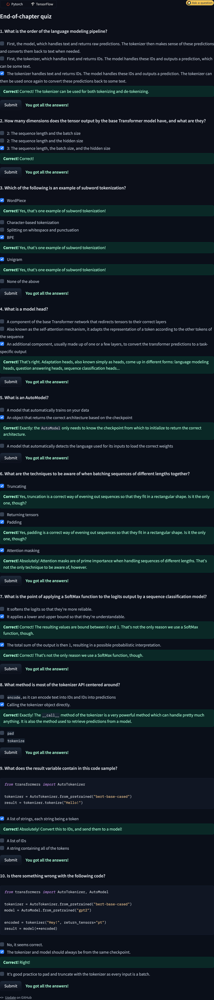

In [4]:
Image.open('assets/2025-06-14 hugging face chapter 2 using transformers quiz answers.png')

# Chapter 3

Neste capítulo existem diferentes quizzes incluindo o quiz final. Nesta seção é falado sobre custom training loops, ordem de treinamento, uso do Accelerate (simplificando o treinamento distribuído e também exemplos de uso), recursos das bibliotecas utilizadas (como model.eval() e torch.no_grad()). Também é possível encontrar uma parte sobre processamento de dados, como utilizar o dataset.map para acelerar o processamento, a parte de padding dinâmico que ajuda a evitar desperdício computacional, os token_type_ids (indicando se o token pertence à primeira ou segunda sentença), como fazer o load do dataset com o load_dataset("glue", "mrpc"): e o que significa o segundo argumento (define uma subtarefa específica). Nesta seção também fala sobre a parte de learning curves e análise de treinamento, detalhando sobre como identificar overfitting e underfitting, a curva de acurácia, curvas erráticas/flutuantes, a utilização de early stopping. Por fim, também é visto questões sobre Trainer API e Fine-Tuning, como definir a processing_class (para indicar ao Trainer qual tokenizador usar), como avaliar usando eval_strategy, como ativar treinamento com precisão mista (fp16=True), usar o compute_metrics para calcular métricas de acurácia, f1, etc., como não ter métricas de validação, e a parte de gradient accumulation.

- Uso de Dataset.map() com batched=True -> Permite aplicar transformações (como tokenização) em vários exemplos de uma vez, o que acelera o processo, especialmente com tokenizers rápidos como o da Hugging Face.
- Padding dinâmico -> Evita usar o maior comprimento da base inteira para todos os exemplos. Faz padding apenas até o comprimento máximo dentro do batch atual, economizando recursos computacionais o que é importante para eficiência no treino sem desperdiçar tempo com tokens inúteis.
- Campo token_type_ids no BERT -> Indica a qual sentença um token pertence em tarefas com pares de sentenças. Por exemplo, em tarefas como inferência textual (NLI), o modelo precisa saber o que é sentença A (0) e o que é sentença B (1).
- Carregamento de subconjuntos de dados com load_dataset -> O segundo argumento define qual tarefa específica (ex: “mrpc”) você quer dentro de um benchmark maior (ex: “glue”).
- Remoção de colunas como sentence1 e sentence2 -> Após a tokenização, o modelo espera tensores numéricos, não mais strings de texto cru.
- Parâmetro processing_class -> Informa ao Trainer qual tokenizer utilizar para processar os dados.
- Frequência de avaliação com eval_strategy -> Define quando a avaliação deve ocorrer durante o treino. 'epoch': ao final de cada época. 'steps': a cada número de passos. 'no': desativa a avaliação.
- Uso de fp16=True -> Ativa o treinamento com precisão mista (Mixed Precision Training). Usa float16 na passagem direta (forward pass) → mais rápido, menos memória. Usa float32 para estabilidade no cálculo dos gradientes (backpropagation).
- Função compute_metrics -> Permite calcular métricas personalizadas (como accuracy, F1, etc.) após cada avaliação.
- Gradient Accumulation -> Técnica usada para simular batch sizes maiores em ambientes com pouca memória.
- Overfitting -> Quando a loss de treino continua caindo enquanto a loss de validação começa a subir, o modelo está memorizando os dados de treino.
- Underfitting -> Quando o modelo tem baixa performance tanto em treino quanto em validação, ele não está aprendendo os padrões.
- Accuracy -> Acurácia é uma métrica discreta: ela só muda quando predições ultrapassam um certo limite (threshold).
- Instabilidade nas curvas de aprendizado -> Se a curva de loss ou acurácia está muito irregular ou flutuante, pode ser por taxa de aprendizado alta demais ou batch size pequeno. A solução costuma ser reduzir a learning rate e/ou aumentar o batch size para estabilizar.
- Early stopping -> Técnica que interrompe o treinamento automaticamente quando a performance de validação para de melhorar ou piora.
- Diferença entre Adam e AdamW -> Ambos são otimizadores baseados em gradientes. AdamW separa o weight decay da atualização de parâmetros, melhorando a regularização e o desempenho.
- Ordem correta no training loop:
    1.	Forward pass (cálculo da loss)
	2.	Backward pass (cálculo dos gradientes)
	3.	Otimização dos pesos
	4.	Atualização do scheduler (se houver)
	5.	Zeragem dos gradientes
- Função da biblioteca Accelerate -> Facilita o treinamento distribuído (multi-GPU/TPU) com mudanças mínimas no código.
- Por que mover os dados para o dispositivo (GPU/CPU)? -> No PyTorch, modelo e dados precisam estar no mesmo dispositivo. Caso contrário, operações matemáticas (como forward e backward) falham.
- Função de model.eval() -> Coloca o modelo em modo de avaliação, desativando: dropout e normalização de batch baseada no batch atual.
- Uso de torch.no_grad() na avaliação -> Desativa o rastreamento de gradientes. Usar accelerator.backward() no lugar de loss.backward(). Permite escalar o código para várias GPUs ou TPUs de forma eficiente.
- Mudanças ao usar Accelerate -> Usar accelerator.prepare() para preparar modelo, otimizador e dataloaders. 

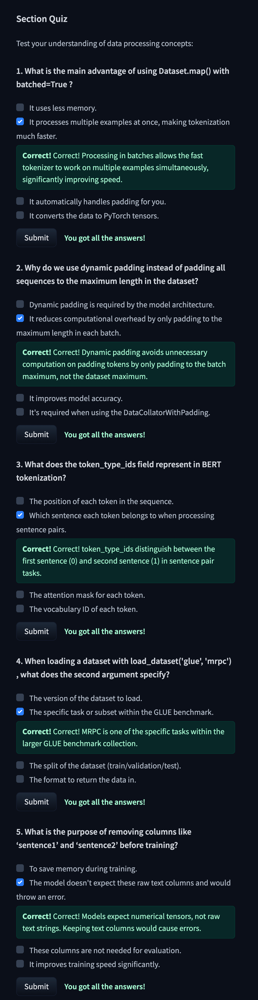

In [5]:
Image.open('assets/2025-06-20 hugging face chapter 3 section quiz data processing.png')

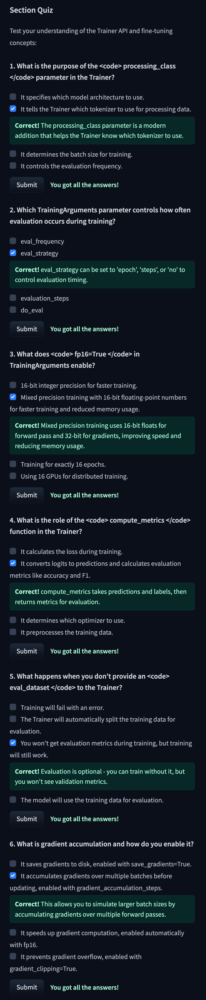

In [6]:
Image.open('assets/2025-06-20 hugging face chapter 3 section quiz trainer api and fine tuning.png')

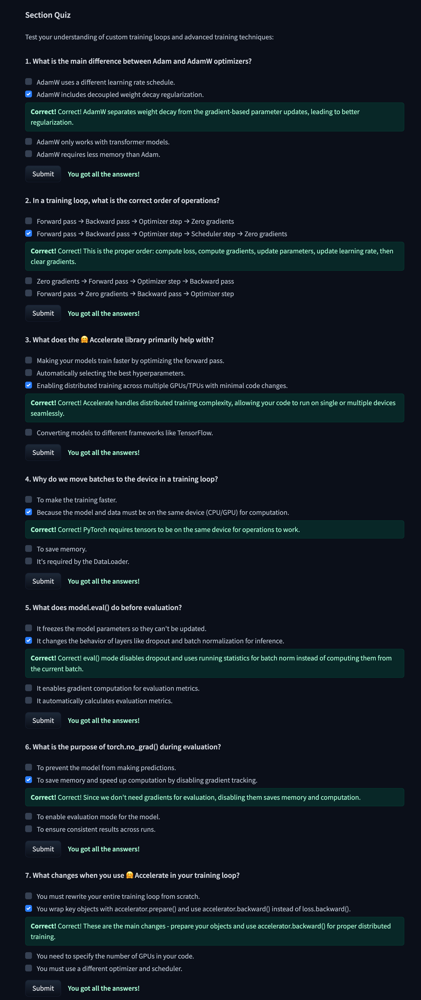

In [7]:
Image.open('assets/2025-06-20 hugging face chapter 3 section quiz custom training loops and advanced training techniques.png')

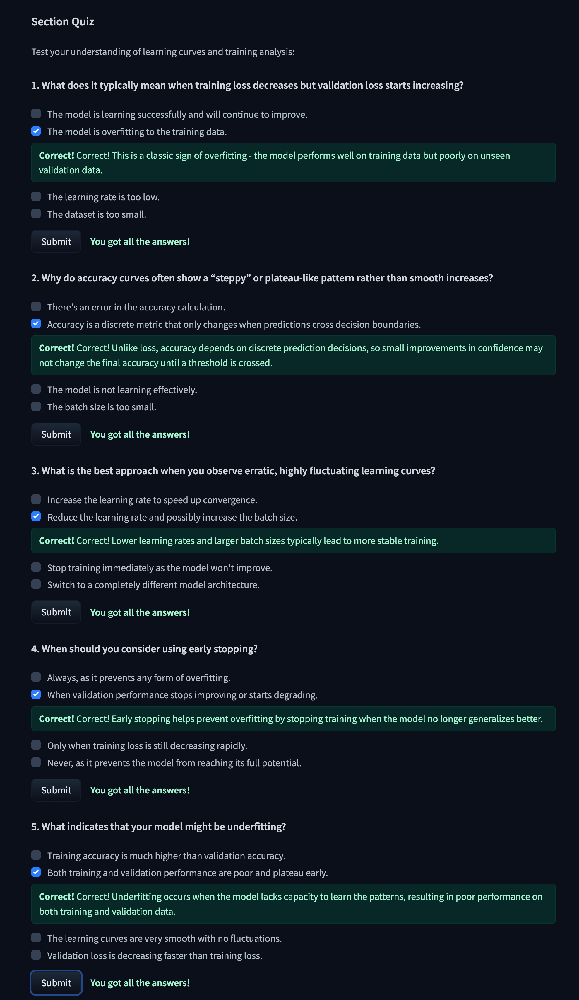

In [8]:
Image.open('assets/2025-06-20 hugging face chapter 3 section quiz learning curves and training analysis.png')

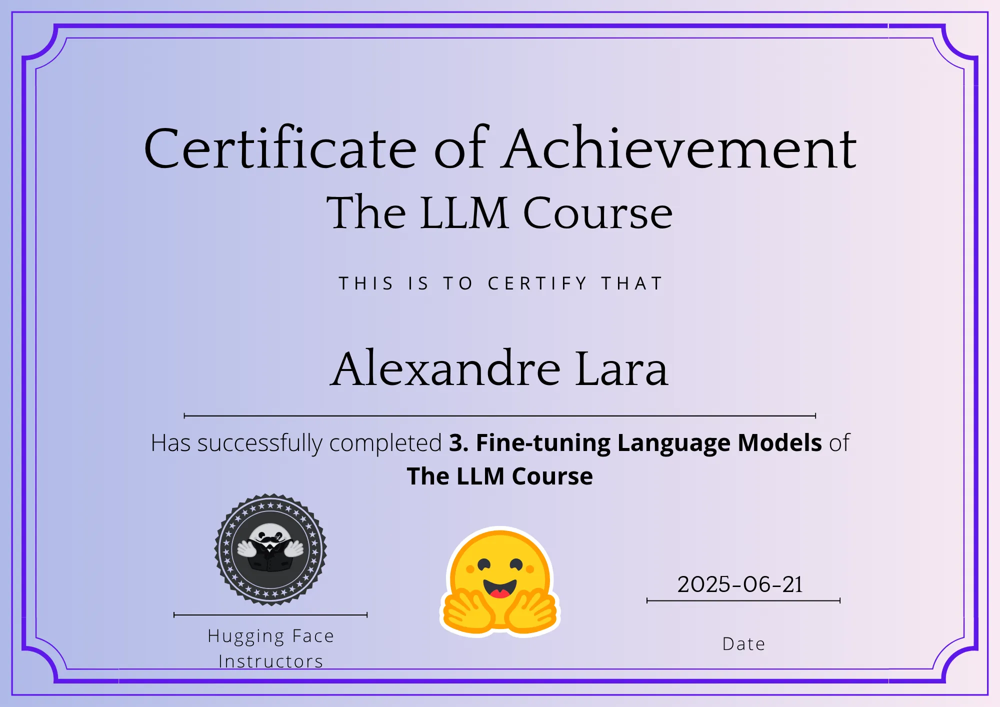

In [9]:
Image.open('assets/2025-06-20 certificate hugging face fundamentals of llms of llms course fine tuning language models.webp')